In [1]:
import json
import os
import pickle
import numpy as np
import detectron2
import torch
from matplotlib.gridspec import GridSpec
from pathlib import Path
import pandas as pd
import pycocotools.mask as RLE
import skimage
import skimage.io

import seaborn as sns
import skimage.measure



import matplotlib.pyplot as plt

from detectron2.structures import instances, Boxes
import torch


ampis_root = Path('../../../')
assert ampis_root.is_dir()

import sys
sys.path.append(str(ampis_root))
sys.path.append('..')
import explore_data_powder


from ampis import analyze, data_utils
from ampis.structures import InstanceSet
from ampis.visualize import quick_visualize_iset, quick_visualize_iset_custom

In [2]:
dataset_name_ = 'particles_crossval'

data_root = Path('../data')
gt_root = data_root / 'via_2.0.8/via_powder_particle_masks.json'
pred_cval_root = data_root / 'particle_cval_predictions' 
assert gt_root.is_file()
assert pred_cval_root.is_dir()


In [3]:
### visualize typical
cval_id = 4 # select which fold to look at
pred_root = pred_cval_root / 'output/cval_{}/Figures/masks/predicted/model_final/outputs.pickle'.format(cval_id)
pred_metrics = pred_cval_root / 'output/cval_{}/metrics.json'.format(cval_id)
assert pred_root.is_file()
assert pred_metrics.is_file()

In [4]:
with open(pred_metrics, 'rb') as f:
    jsondata = [json.loads(x) for x in f.readlines()]

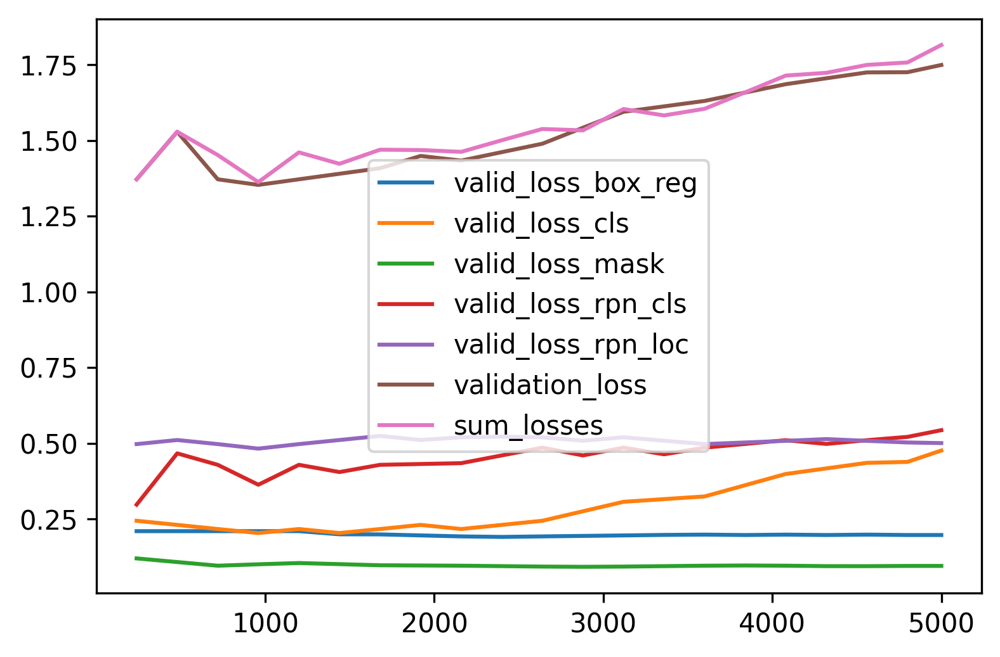

In [5]:
val_entries = [x for x in jsondata if 'validation_loss' in x.keys()]
val_keys = [k for k in val_entries[0].keys() if 'val' in k]

fig, ax = plt.subplots(dpi=300)


results = {}
results['iter'] = [x['iteration'] for x in val_entries]
for k in val_entries[0].keys():
    if 'val' in k:
        results[k] = [x[k] for x in val_entries ]
        ax.plot(results['iter'], results[k], label=k)
        
df = pd.DataFrame(results)
df['sum_losses'] = df[[x for x in df.columns if 'valid_' in x]].sum(axis=1)
ax.plot(results['iter'], df['sum_losses'], label='sum_losses')
leg = ax.legend()

In [6]:
# predicted data loaded first- organized by training followed by validation
with open(pred_root, 'rb') as f:
    pred_data = pickle.load(f)

pred_instances = [analyze.InstanceSet().read_from_model_out(
    x,True) for x in pred_data.values()]
    
    
gt_instances = [analyze.InstanceSet().read_from_ddict(x, True)
              for x in explore_data_powder.get_data_dicts(gt_root)]

metadata = explore_data_powder.get_metadata(gt_root)

pred_instances, gt_instances = analyze.align_instance_sets(pred_instances, gt_instances)

In [7]:
num_instances_total_ = [len(x.instances) for x in gt_instances]
num_instances_total_, sum(num_instances_total_)

([238, 351, 219, 293, 259], 1360)

In [8]:
for pred, gt in zip(pred_instances, gt_instances):
    pred.dataset_class = 'Training' if 'Training' in pred.dataset_class else 'Validation'
    gt.dataset_class = pred.dataset_class

In [9]:
# ground truth
gt = gt_instances[-1]

# predicted
pred = pred_instances[-1]
print(pred.filepath, pred.dataset_class)

Sc2Tile_001-001-000_0-000.png Validation


In [10]:
gt.instances.masks

PolygonMasks(num_instances=259)

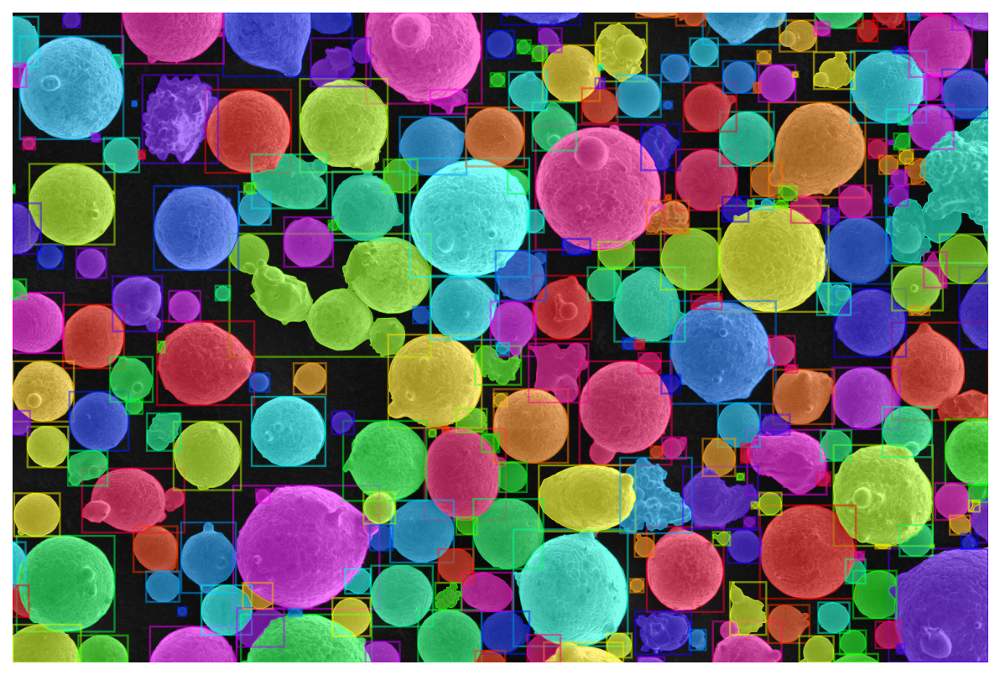

In [11]:
img = skimage.io.imread(gt.filepath)
img = skimage.color.gray2rgb(img)

quick_visualize_iset(img, metadata, gt)

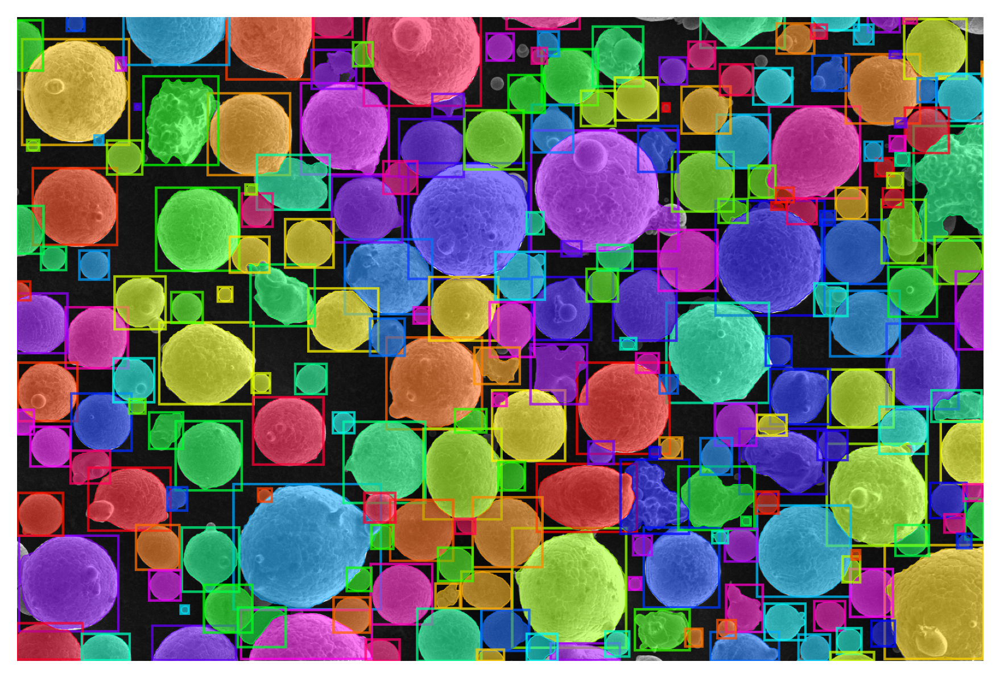

In [12]:
fig, ax = plt.subplots(figsize=(10,5), dpi=300)
vis_img_ = quick_visualize_iset_custom(img, metadata, pred, ax=ax, return_visualizer=True)
skimage.io.imsave('Figures/particles_example_{}'.format(Path(pred.filepath).name),
                  vis_img_)
fig.savefig('Figures/particles_example_{}'.format(Path(pred.filepath).name))

In [13]:
# pred_detect = pred.copy()
# pred_detect.instances.remove('masks')
# fig, ax = plt.subplots(figsize=(10,5), dpi=300)
# quick_visualize_iset_custom(img, metadata, pred_detect, ax=ax)
# fig.savefig('/home/ryan/Documents/temp/misc images/custom_boxes/particles_example_detection_{}'.format(Path(pred_detect.filepath).name))

In [14]:
for isetlist in [gt_instances, pred_instances]:
    for iset in isetlist:
        iset.instances = iset.filter_mask_size(min_thresh=0, to_rle=True)
        

In [15]:
mmr = [analyze.mask_match_scores(x.instances.masks, y.instances.masks, size=x.instances.image_size) 
       for x, y in zip(gt_instances, pred_instances)]

match_precision = [x['match_precision'] for x in mmr]
match_recall = [x['match_recall'] for x in mmr]

mask_precision = [x['mask_precision'] for x in mmr]
mask_recall = [x['mask_recall'] for x in mmr]

mask_precision_global = [sum(x['mask_tp'])/(sum(x['mask_tp'])+sum(x['mask_fp'])) for x in mmr]
mask_recall_global = [sum(x['mask_tp'])/(sum(x['mask_tp'])+sum(x['mask_fn'])) for x in mmr]

Text(0, 0.5, 'cumulative fraction')

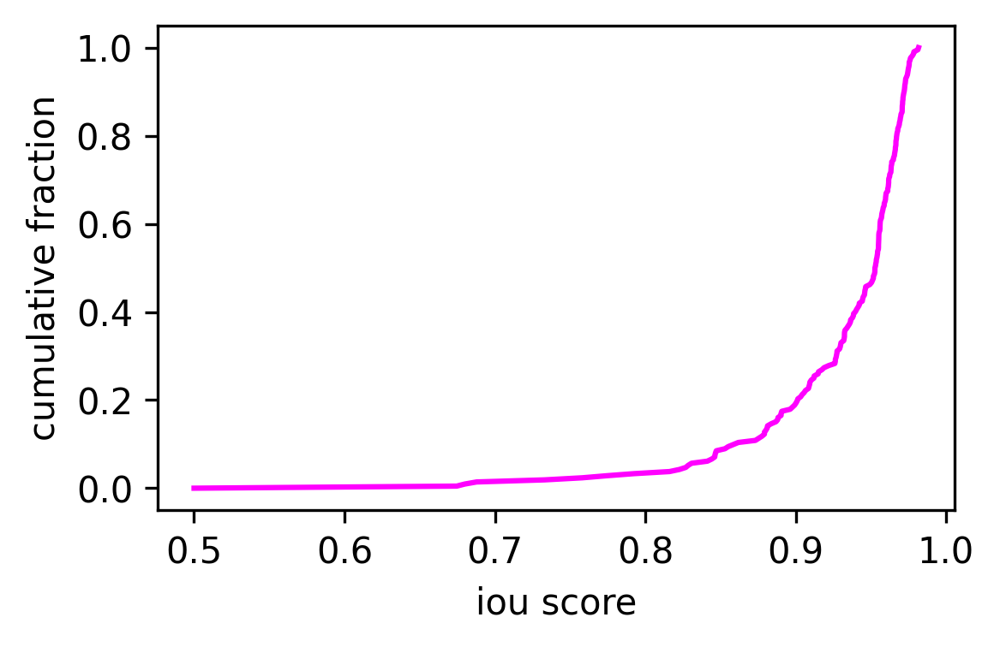

In [16]:
unique, counts = np.unique(mmr[-1]['match_tp_iou'], return_counts=True)
if 0.5 < unique[0]:
    unique = np.concatenate(([0.5], unique))
    counts = np.concatenate(([0], counts))
fig, ax = plt.subplots(dpi=300, figsize=(4,2.5))
ax.plot(unique, counts.cumsum()/counts.sum(), color='magenta')
ax.set_xlabel('iou score')
ax.set_ylabel('cumulative fraction')

In [17]:
argmax_idx = np.argmax(unique >= 0.9)
counts.cumsum()[argmax_idx]/counts.sum()

0.19339622641509435

In [18]:
## mask edge distances- new feature
mmri = mmr[-1]['match_tp']
gti = gt_instances[-1]
predi = pred_instances[-1]

gti_boxes = data_utils.extract_boxes(RLE.decode(gti.instances.masks.rle), 
                                     mask_mode='matterport', box_mode='matterport')
predi_boxes = data_utils.extract_boxes(RLE.decode(predi.instances.masks.rle), 
                                       mask_mode='matterport', box_mode='matterport')

# false positive ,false negative
dist_results = analyze.mask_edge_distance(gti.instances.masks, predi.instances.masks, 
                                         gti_boxes, predi_boxes, mmri, force_cpu=True)

In [19]:
fp_dist_results = np.concatenate([x.cpu().numpy() for x in dist_results[0] if x.numel()])
fn_dist_results = np.concatenate([x.cpu().numpy() for x in dist_results[1] if x.numel()])

fp_unique_ = np.unique(fp_dist_results, return_counts=True)
fn_unique_ = np.unique(fn_dist_results, return_counts=True)

In [20]:
fp_dist_ = fp_unique_[0]
fp_counts_ = fp_unique_[1].cumsum()/fp_unique_[1].sum()

fn_dist_ = fn_unique_[0]
fn_counts_ = fn_unique_[1].cumsum()/fn_unique_[1].sum()

In [21]:
i1i = 0
i2i = 14
print('false positives: {}'.format(fp_unique_[1].sum()))
print('\tdistance:',np.round(fp_dist_[i1i:i2i], decimals=2))
print('\t  counts:',np.round(fp_counts_[i1i:i2i], decimals=2),'\n')
print('false negatives: {}'.format(fn_unique_[1].sum()))
print('\tdistance:',np.round(fn_dist_[i1i:i2i], decimals=2))
print('\t  counts:',np.round(fn_counts_[i1i:i2i], decimals=2))

false positives: 15109
	distance: [1.   1.41 2.   2.24 2.83 3.   3.16 3.61 4.   4.12 4.24 4.47 5.   5.1 ]
	  counts: [0.65 0.73 0.8  0.82 0.84 0.85 0.86 0.87 0.87 0.88 0.88 0.89 0.89 0.9 ] 

false negatives: 39889
	distance: [1.   1.41 2.   2.24 2.83 3.   3.16 3.61 4.   4.12 4.24 4.47 5.   5.1 ]
	  counts: [0.43 0.48 0.59 0.6  0.61 0.64 0.65 0.65 0.66 0.67 0.67 0.67 0.68 0.68]


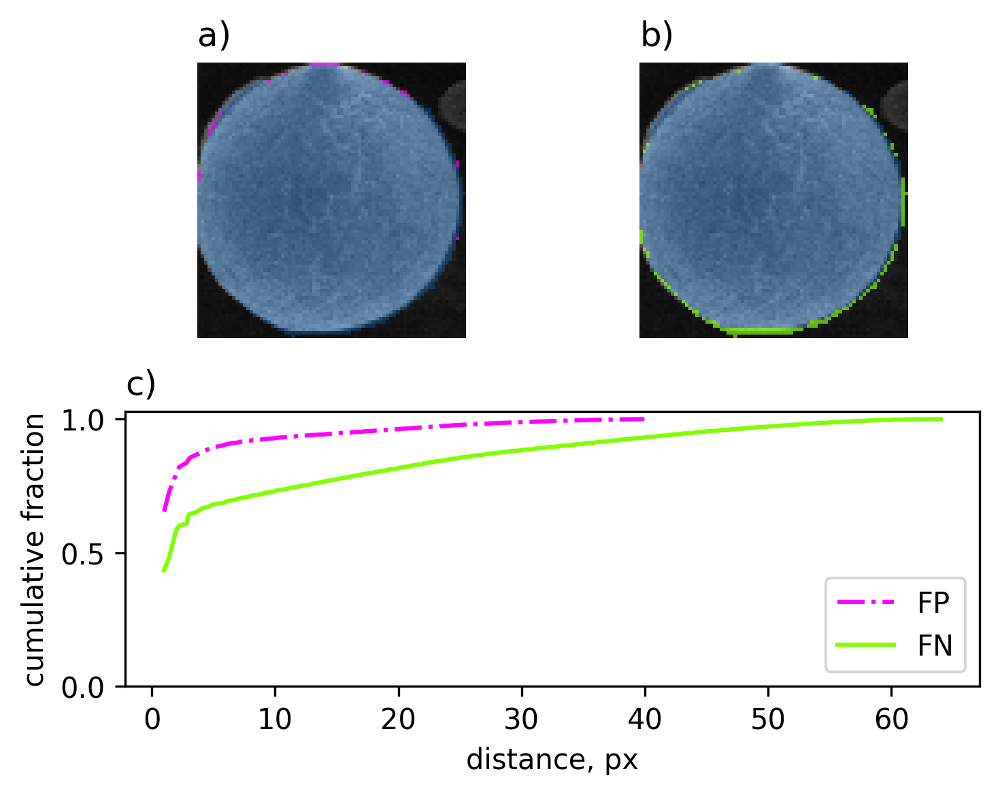

In [54]:
j = 48
gt_x = RLE.decode(gti.instances.masks.rle[mmri[j,0]])
pred_x = RLE.decode(predi.instances.masks.rle[mmri[j,1]])
r1, r2, c1, c2 = analyze.merge_boxes(*(data_utils.extract_boxes(x, box_mode='matterport')[0] for x in [gt_x, pred_x]))

img = skimage.io.imread(gti.filepath, as_gray=True)[r1:r2,c1:c2]
img = skimage.color.gray2rgb(img)

gt_x = gt_x[r1:r2, c1:c2]
pred_x = pred_x[r1:r2, c1:c2]

fp = np.logical_and(pred_x, np.logical_not(gt_x))
fn = np.logical_and(gt_x, np.logical_not(pred_x))

fp_colors = [[255, 255, 255, 0], # background- won't show up (alpha = 0)
             [0, 128, 255, 70], # mask- 
             [255, 0, 255, 175 ]]  # fp

fn_colors = [[255, 255, 255, 0], # background- won't show up (alpha = 0)
             [0, 128, 255, 70], # mask- 
             [128, 255, 0, 175 ]]  # fn




fpgraph = gt_x.copy().astype(np.int)
fpgraph[fp] = 2
fp_img = np.zeros((*fpgraph.shape, 4), np.int)

fngraph = pred_x.copy().astype(np.int)
fngraph[fn] = 2
fn_img = np.zeros((*fngraph.shape, 4), np.int)

for i, (fpc, fnc) in enumerate(zip(fp_colors, fn_colors)):
    fp_img[fpgraph == i] = fpc
    fn_img[fngraph == i] = fnc

fp_alpha_map = fp_img[:,:,-1:]
fn_alpha_map = fn_img[:,:,-1:]
fp_img = img / 255 * (1-fp_alpha_map / 255.) + fp_img[:,:,:-1] / 255 * (fp_alpha_map / 255.)
fn_img = img / 255 * (1-fn_alpha_map / 255.) + fn_img[:,:,:-1] / 255 * (fn_alpha_map / 255.) 

    
fig = plt.figure(tight_layout=True, figsize=(5,4), dpi=300)
gs = GridSpec(nrows = 2, ncols=2, figure=fig)
ax = [fig.add_subplot(gs[0,0]),
      fig.add_subplot(gs[0,1]),
      fig.add_subplot(gs[1,:])]
for a in ax[:2]: a.axis('off')

a = ax[0]
a.imshow(fp_img)
a.set_title('a)', loc='left')

a = ax[1]
a.imshow(fn_img)
a.set_title('b)', loc='left')

a = ax[2]
a.plot(fp_unique_[0], fp_unique_[1].cumsum()/fp_unique_[1].sum(), color='fuchsia', linestyle='-.', label='FP')
a.plot(fn_unique_[0], fn_unique_[1].cumsum()/fn_unique_[1].sum(), color='chartreuse', label='FN')
a.legend(loc='lower right')
a.set_xlabel("distance, px")
a.set_ylabel('cumulative fraction')
a.set_ylim([0,1.03])
a.set_title('c)', loc='left')
fig.savefig('Figures/distances.png', bbox_inches='tight')

In [23]:
def generate_labels(ins):
    labels = []
    counts = {'Training':0,
             'Validation':0,
             'Test':0}
    
    for iset in ins:
        counts[iset.dataset_class] += 1
        labels.append('{} {}'.format(iset.dataset_class, counts[iset.dataset_class]))
    return labels

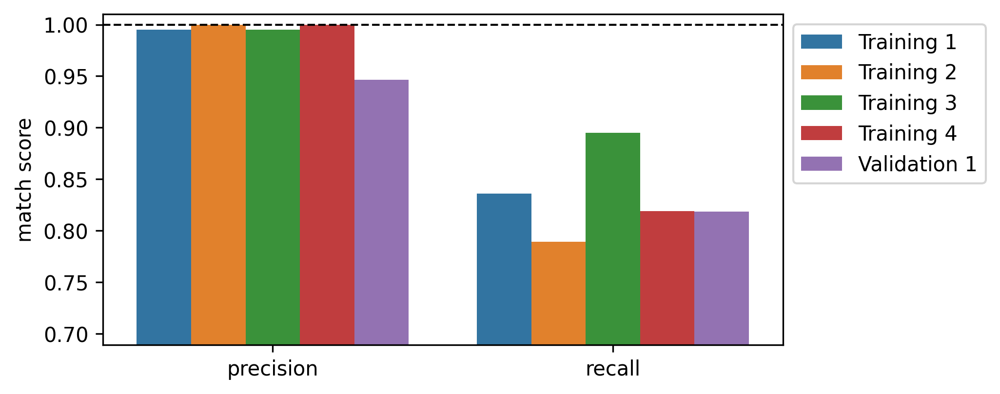

In [24]:
files = generate_labels(gt_instances)

files_list = []
[files_list.extend(files) for _ in range(2)]


y = np.concatenate((match_precision, match_recall), axis=0)

x = []
[x.extend([i]*len(files)) for i in ['precision', 'recall']]

df_match = pd.DataFrame()

df_match['files'] = files_list
df_match['y'] = y
df_match['x'] = x

fig, ax = plt.subplots(figsize=(6,3), dpi=300)
sns.barplot(x="x", y="y",  hue='files', data=df_match, ax=ax)
ax.legend(bbox_to_anchor=(1,1))
ax.set_ylabel('match score')
ax.set_xlabel('')
xlims = ax.get_xlim()
ax.plot(xlims, [1,1], '--k', linewidth=1)
ax.set_xlim(xlims)
ax.set_ylim([min(y)-0.1,1.01])

plt.show()


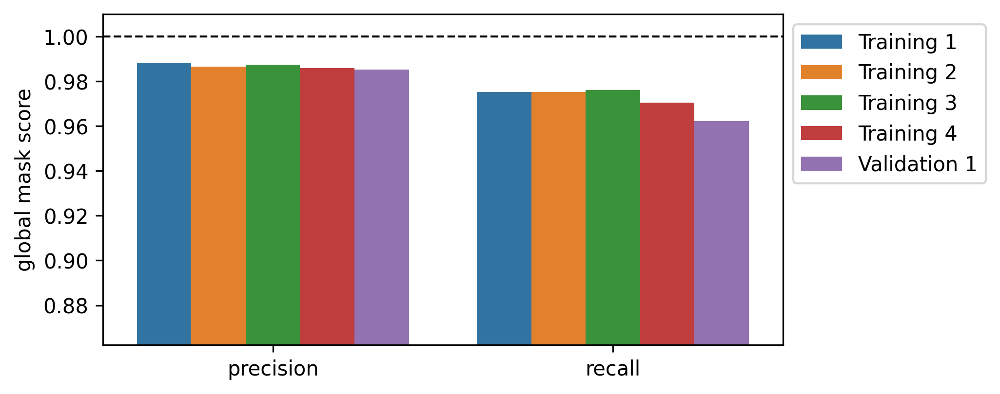

In [25]:
files = generate_labels(gt_instances)

files_list = []
[files_list.extend(files) for _ in range(2)]


y = np.concatenate((mask_precision_global, mask_recall_global), axis=0)

x = []
[x.extend([i]*len(files)) for i in ['precision', 'recall']]

df_match = pd.DataFrame()

df_match['files'] = files_list
df_match['y'] = y
df_match['x'] = x

fig, ax = plt.subplots(figsize=(6,3), dpi=300)
sns.barplot(x="x", y="y",  hue='files', data=df_match, ax=ax)
ax.legend(bbox_to_anchor=(1,1))
ax.set_ylabel('global mask score')
ax.set_xlabel('')
xlims = ax.get_xlim()
ax.plot(xlims, [1,1], '--k', linewidth=1)
ax.set_xlim(xlims)
ax.set_ylim([min(y)-0.1,1.01])

plt.show()


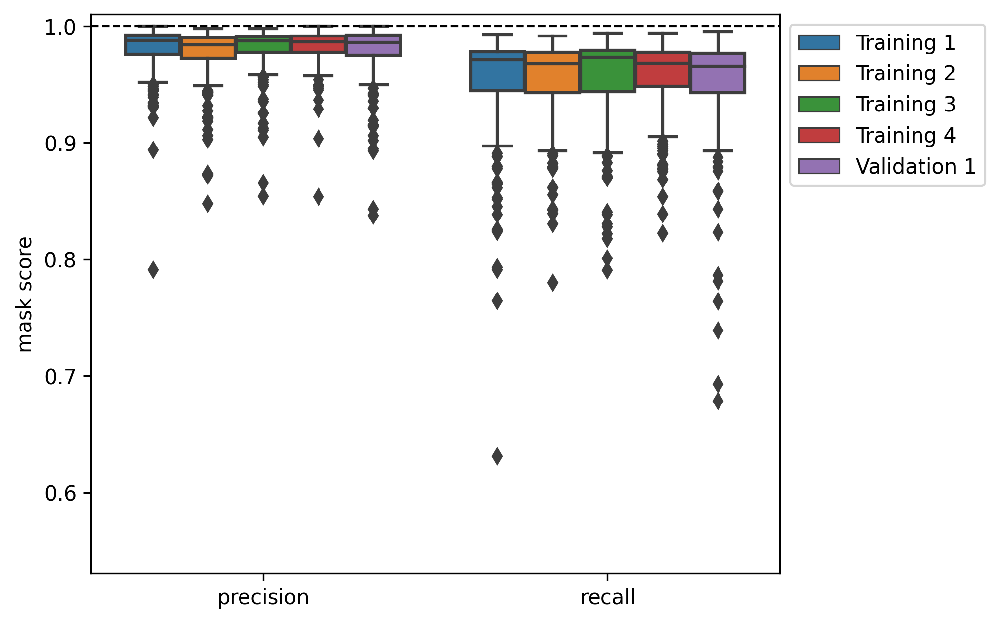

In [26]:
y = np.concatenate((mask_precision, mask_recall,), axis=0)

newx = []
newy = []
newfiles = []

for xi, yi, file in zip(x, y, files_list):
    for yii in yi:
        newx.append(xi)
        newy.append(yii)
        newfiles.append(file)
df_mask = pd.DataFrame()

df_mask['files'] = newfiles
df_mask['y'] = newy
df_mask['x'] = newx

fig, ax = plt.subplots(figsize=(6,5), dpi=300)
#box = ax.get_position()
#ax.set_position([0,0,box.width,box.height])
sns.boxplot(x="x", y="y",  hue='files', data=df_mask, 
            ax=ax, showfliers=True)
l1 = ax.legend(bbox_to_anchor=(1.0,1.0))
ax.set_ylabel('mask score')
ax.set_xlabel('')
xlims = ax.get_xlim()
ax.plot(xlims, [1,1], '--k', linewidth=1)
ax.set_xlim(xlims)
ax.set_ylim([min(newy)-0.1, 1.01])
plt.show()

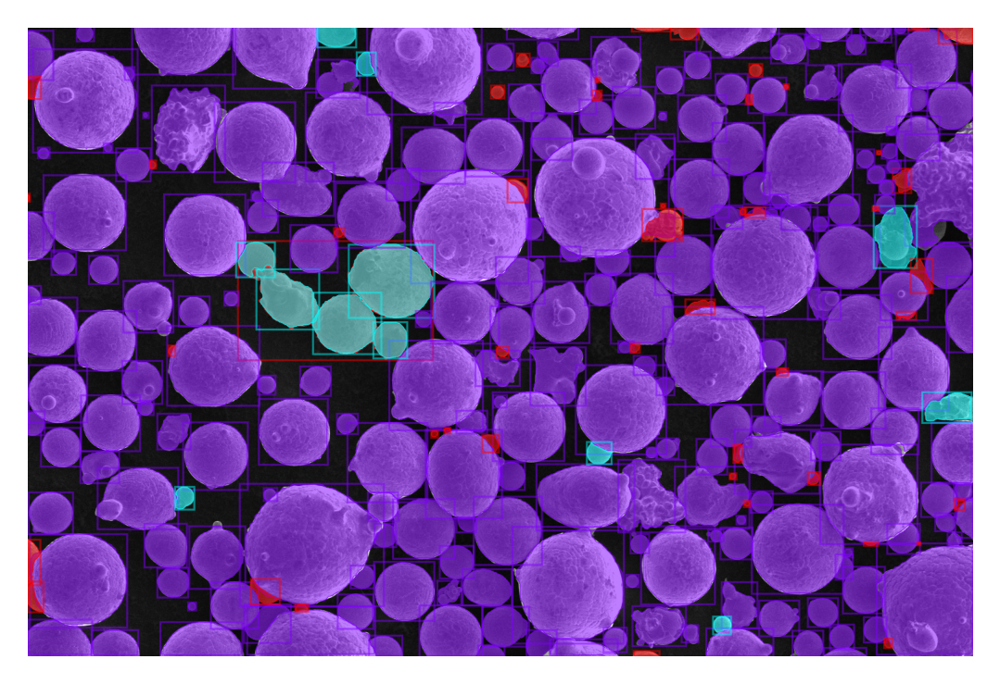

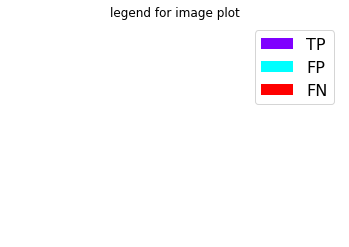

In [27]:
pred = pred_instances[-1]
gt = gt_instances[-1]

gtmasks = analyze.masks_to_rle(gt.instances.masks, gt.instances.image_size)
predmasks = analyze.masks_to_rle(pred.instances.masks, pred.instances.image_size)
match_results_ = analyze.rle_instance_matcher(gtmasks, predmasks)


is_match, colormap = analyze.match_perf_iset(gt, pred, match_results_)

img = skimage.io.imread(gt.filepath)
img = skimage.color.gray2rgb(img)
fig, ax = plt.subplots(1,1, figsize=(5,3), dpi=300, facecolor=(0,0,0,0))
quick_visualize_iset(img, metadata, is_match, ax=ax)
fig.savefig('Figures/match_sample.png', bbox_inches='tight')
fig, ax = plt.subplots(1,1)
for i, name in enumerate(['TP','FP','FN']):
    ax.bar(-1000-i, 4+i, color=colormap[name], label=name)
    
ax.axis([0,10,0,10])
ax.legend(fontsize=16)
ax.set_title('legend for image plot')
ax.axis('off')
    
plt.show()


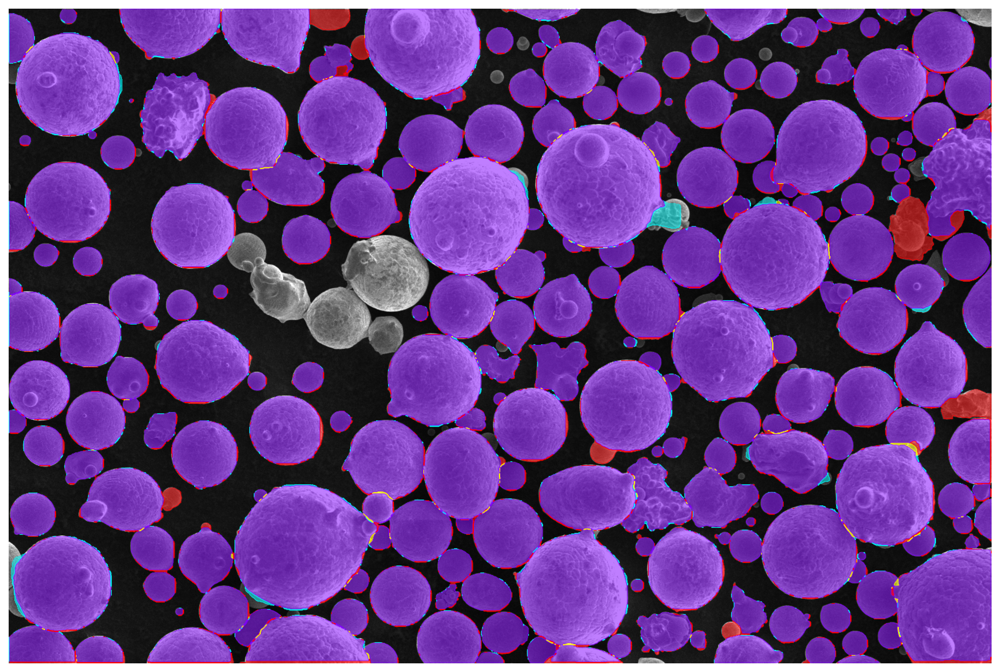

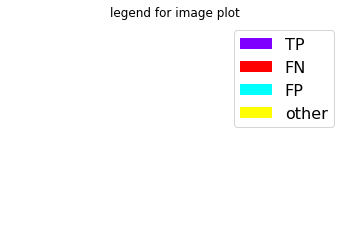

In [28]:
mask_iset, [colors, color_labels] = analyze.mask_perf_iset(gt.instances.masks, 
                                                            pred.instances.masks, 
                                                            mode='reduced')
mask_iset.colors = colors
img = skimage.io.imread(gt.filepath)
img = skimage.color.gray2rgb(img)

fig, ax = plt.subplots(figsize=(15,10), dpi=300)
mask_iset.instances.masks = RLE.decode(mask_iset.instances.masks.rle).transpose((2,0,1))
vis_img = quick_visualize_iset_custom(img, metadata, mask_iset, ax=ax, return_visualizer=True)

mask_correction = np.logical_or.reduce(mask_iset.instances.masks, axis=0)
mask_correction = np.logical_not(mask_correction)

vis_img[mask_correction] = img[mask_correction] # i guess visualizer sometimes fills in 
                                     # maskss with gap? need to account for this for some images
ax.imshow(vis_img)
plt.show()
fig.savefig('./Figures/mask_fig.png', bbox_inches='tight')

fig, ax = plt.subplots()
for i in range(4):
    ax.bar(-1000-i, 4+i, color=colors[i], label=color_labels[i])
    ax.axis('off')


ax.axis([0,10,0,10])
ax.legend(fontsize=16)
ax.set_title('legend for image plot')

    
plt.show()


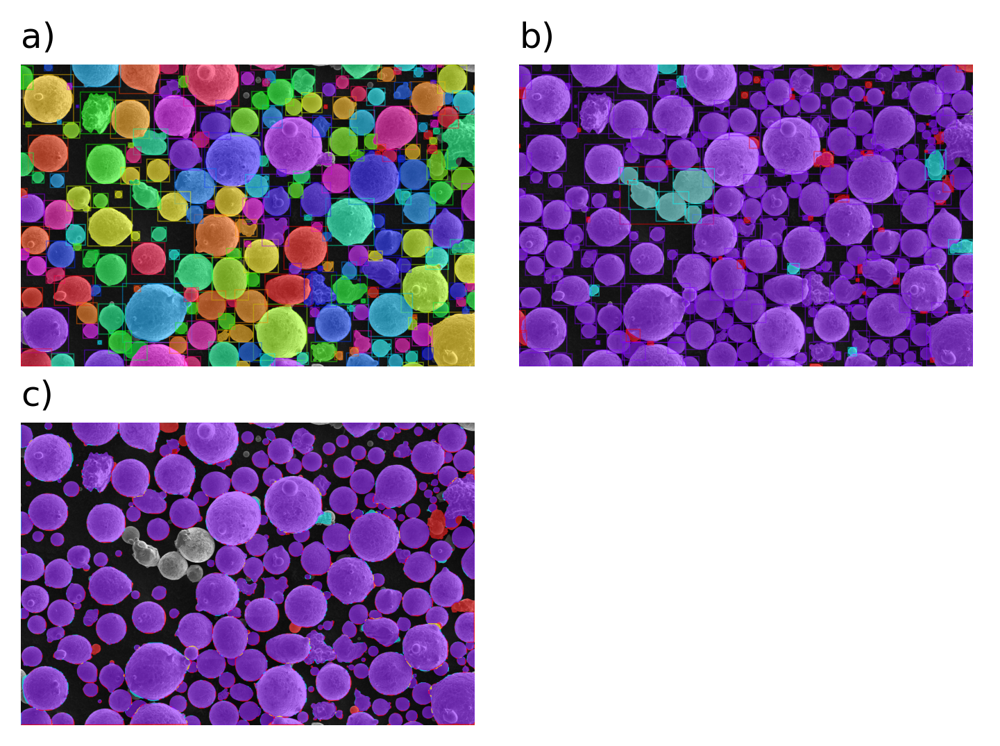

In [49]:
fig, ax = plt.subplots(2,2,dpi=300,figsize=(3.8*1.3,2.8*1.3))
quick_visualize_iset(img, metadata, pred, ax=ax[0,0])
for a, title in zip(ax.ravel(), ['a)','b)','c)']) : a.set_title(title, loc='left', fontsize=12)
quick_visualize_iset(img, metadata, is_match, ax=ax[0,1])
ax[1,0].imshow(vis_img)
ax[1,0].axis('off')
ax[1,1].axis('off')
fig.tight_layout()
fig.savefig('Figures/powder_predictions.png')

In [ ]:
## mask distance- new


In [ ]:
list((pred_cval_root / 'output').glob("*"))

In [ ]:
cval_id = 3 # select which fold to look at
def cval_mmr(cval_id):
    """
    analyze results for a single fold during cross validation
    """
    pred_root = pred_cval_root / 'output/cval_{}/Figures/masks/predicted/model_final/outputs.pickle'.format(cval_id)


    # predicted data loaded first- organized by training followed by validation
    with open(pred_root, 'rb') as f:
        pred_data = pickle.load(f)

    pred_instances = [analyze.InstanceSet().read_from_model_out(
        x,True) for x in pred_data.values()]

    gt_instances = [analyze.InstanceSet().read_from_ddict(x, True)
                  for x in explore_data_powder.get_data_dicts(gt_root)]

    metadata = explore_data_powder.get_metadata(gt_root)

    pred_instances, gt_instances = analyze.align_instance_sets(pred_instances, gt_instances)



    gt_instances = [analyze.InstanceSet().read_from_ddict(x, True)
                  for x in explore_data_powder.get_data_dicts(gt_root)]

    metadata = explore_data_powder.get_metadata(gt_root)

    pred_instances, gt_instances = analyze.align_instance_sets(pred_instances, gt_instances)

    for pred, gt in zip(pred_instances, gt_instances):
        pred.dataset_class = 'Training' if 'Training' in pred.dataset_class else 'Validation'
        gt.dataset_class = pred.dataset_class

    pred_instances_val = [x for x in pred_instances if x.dataset_class == 'Validation']
    gt_instances_val = [x for x in gt_instances if x.dataset_class == 'Validation']

    for isetlist in [gt_instances, pred_instances]:
        for iset in isetlist:
            iset.instances = iset.filter_mask_size(min_thresh=0, to_rle=True)

    mmr = [analyze.mask_match_scores(x.instances.masks, y.instances.masks, size=x.instances.image_size) 
           for x, y in zip(gt_instances_val, pred_instances_val)]
    return mmr, gt_instances_val, pred_instances_val

cval_folds = []
cval_gt_instances = []
cval_pred_instances = []

for i in range(5):
    mmr, gt_instances, pred_instances = cval_mmr(i)
    cval_folds.append(mmr)
    cval_gt_instances.append(gt_instances)
    cval_pred_instances.append(pred_instances)
    
#cval_folds = [cval_mmr(i) for i in range(5)]



In [ ]:
nfolds = len(cval_folds)
cval_match_precision = np.zeros(nfolds)
cval_match_recall = np.zeros(nfolds)

cval_mask_precision_global = np.zeros(nfolds)
cval_mask_recall_global = np.zeros(nfolds)

cval_mask_precision_avg = np.zeros(nfolds)
cval_mask_recall_avg = np.zeros(nfolds)

cval_mask_precision_med = np.zeros(nfolds)
cval_mask_recall_med = np.zeros(nfolds)

for i, fold in enumerate(cval_folds):
    match_tp = sum([len(x['match_tp']) for x in fold])
    match_fp = sum([len(x['match_fp']) for x in fold])
    match_fn = sum([len(x['match_fn']) for x in fold])
    
    # for global mask stats
    mask_tp = sum([sum(x['mask_tp']) for x in fold])
    mask_fp = sum([sum(x['mask_fp']) for x in fold])
    mask_fn = sum([sum(x['mask_fn']) for x in fold])
    
    cval_match_precision[i] = match_tp/(match_tp+match_fp)
    cval_match_recall[i] = match_tp/(match_tp+match_fn)
    
    cval_mask_precision_global[i] = mask_tp/(mask_tp+mask_fp)
    cval_mask_recall_global[i] = mask_tp/(mask_tp+mask_fn)
    
    # for mean average mask stats
    mask_precision_all = []
    mask_recall_all = []
    for file in fold:
        mask_precision_all += list(file['mask_precision'])
        mask_recall_all += list(file['mask_recall'])
    
    cval_mask_precision_avg[i] = np.mean(mask_precision_all)
    cval_mask_recall_avg[i] = np.mean(mask_recall_all)
    
    cval_mask_precision_med[i] = np.median(mask_precision_all)
    cval_mask_recall_med[i] = np.median(mask_recall_all)
    
    

In [ ]:
print('score\t\t\t\t 0      1     2     3     4         avg     std')
for label, scores in zip(['cval_match_precision\t', 'cval_match_recall\t', 
                          'cval_mask_precision_global', 'cval_mask_recall_global\t',
                         'cval_mask_precision_avg\t', 'cval_mask_recall_avg\t',
                         'cval_mask_precision_med\t','cval_mask_recall_med\t'], 
                         [cval_match_precision, cval_match_recall, 
                          cval_mask_precision_global, cval_mask_recall_global,
                          cval_mask_precision_avg, cval_mask_recall_avg,
                         cval_mask_precision_med, cval_mask_recall_med]):
    
    print(label, end='\t')
    print(np.round(scores, decimals=3), end='\t| ')
    print(np.round(scores.mean(), decimals=3), end='\t| ')
    print(np.round(np.std(scores), decimals=3))

In [ ]:
fn_areas = np.concatenate([RLE.area(gt[0].instances[mmr[0]['match_fn']].masks.rle) 
for gt, mmr in zip(cval_gt_instances, cval_folds)])
unique, counts = np.unique(fn_areas, return_counts=True)
counts = counts.cumsum()
counts = counts / counts[-1]
fig, ax = plt.subplots()
ax.plot(unique, counts)
ax.set_yticks([x/10 for x in range(1,10, 2)], minor=True)
ax.set_xscale('log')
ax.grid(which='both')

In [ ]:
results = {'gt_val': cval_gt_instances,
          'pred_val': cval_pred_instances}

save=True
if save:
    for gt_or_pred in [cval_gt_instances, cval_pred_instances]:
        for isetlist in gt_or_pred:
            for iset in isetlist:
                iset.compute_rprops()
    with open(data_root / 'powder_particle_cval_validation_InstanceSets.pickle', 'wb') as f:
        pickle.dump(results, f)

In [ ]:
areas_all = []
areas_fn = []
areas_tp = []
areas_fp = []
for iset, isetpred, mmri in zip(cval_gt_instances,cval_pred_instances, cval_folds):
    assert len(iset) == len(mmri) == len(isetpred) == 1
    iset = iset[0]
    mmri = mmri[0]
    isetpred = isetpred[0]
    areas_all.append(RLE.area(iset.instances.masks.rle))
    fn_masks = iset.instances[mmri['match_fn']]
    tp_masks = iset.instances[[x[0] for x in mmri['match_tp']]]
    fp_masks = isetpred.instances[mmri['match_fp']]
    areas_fn.append(RLE.area(fn_masks.masks.rle))
    areas_tp.append(RLE.area(tp_masks.masks.rle))
    areas_fp.append(RLE.area(fp_masks.masks.rle))
areas_all = np.concatenate(areas_all)
areas_fn = np.concatenate(areas_fn)
areas_tp = np.concatenate(areas_tp)
areas_fp = np.concatenate(areas_fp)

[len(x) for x in [areas_all, areas_fn, areas_tp, areas_fp]]

In [ ]:
im_width_px = 1536
im_hfw = 1036

def area_to_d(areas_px): return 2*np.sqrt((areas_px * (im_hfw/im_width_px)**2)/np.pi)

fig, ax = plt.subplots(figsize=(6,3), dpi=150)
for results, label in zip([areas_all, areas_fn, areas_tp, areas_fp], ['all ground truth','false negative',
                                                                     'true positive', 'false positive']):
    d_eq = area_to_d(results)
    unique, counts = np.unique(d_eq, return_counts=True)
    counts = counts.cumsum()/counts.sum()
    ax.plot(unique, counts, label=label)

ax.legend()
ax.set_title('powder particles')
ax.set_xlabel('equivalent diameter, um')
ax.set_ylabel('cumulative number fraction')
ax.grid(which='both')